# Smol Geolife

The goal of this notebook is to identify a small piece of Beijing that has interesting criss-crossing roads and do a very easy simulation with a small (10?) number of sensors and infrequent interactions (maybe every 5 seconds?). This is to provide the basis for a small proof of concept of the attacks instead of carrying it out over the entirety of Beijing.

In [1]:
import pickle
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt


In [2]:
dict_path = "ground_truth/big_dict.pkl"
with open(dict_path, 'rb') as dict_file:
    big_dict = pickle.load(dict_file)


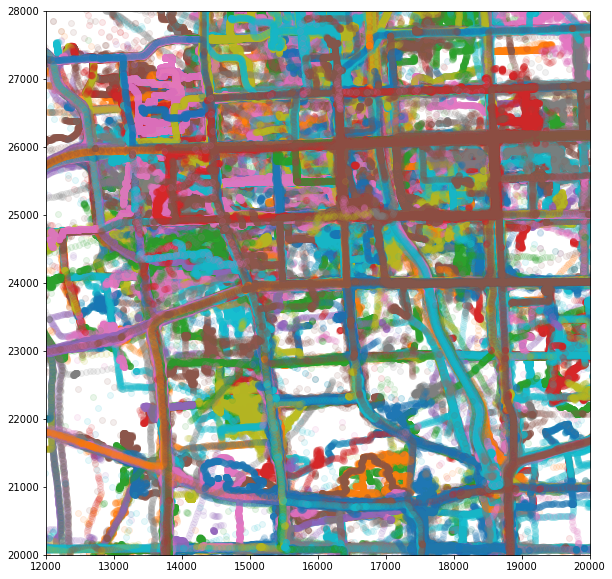

In [7]:
plt.figure(figsize=(18,10))
plt.xlim([12000, 20000])
plt.ylim([20000, 28000])
plt.gca().set_aspect('equal')
for person_id in big_dict:
    plt.scatter(big_dict[person_id]['x'], big_dict[person_id]['y'], alpha=0.1)
plt.show()

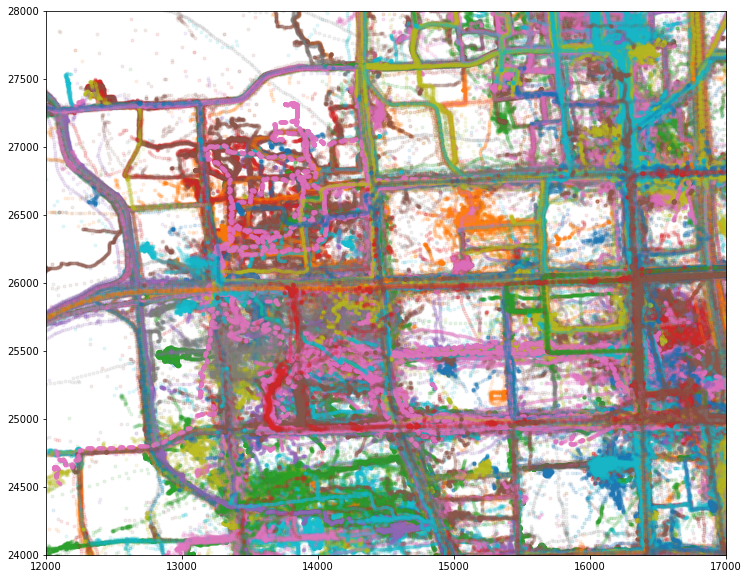

In [8]:
plt.figure(figsize=(18,10))
plt.xlim([12000, 17000])
plt.ylim([24000, 28000])
plt.gca().set_aspect('equal')
for person_id in big_dict:
    plt.scatter(big_dict[person_id]['x'], big_dict[person_id]['y'], alpha=0.1, marker='.')
plt.show()

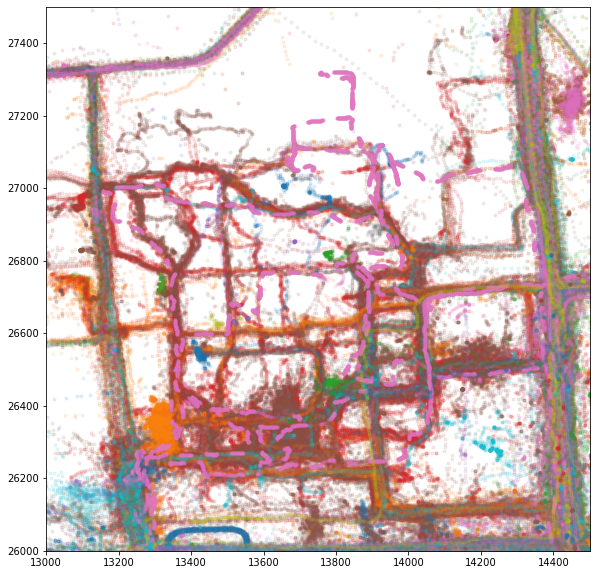

In [9]:
plt.figure(figsize=(18,10))
plt.xlim([13000, 14500])
plt.ylim([26000, 27500])
plt.gca().set_aspect('equal')
for person_id in big_dict:
    plt.scatter(big_dict[person_id]['x'], big_dict[person_id]['y'], alpha=0.1, marker='.')
plt.show()

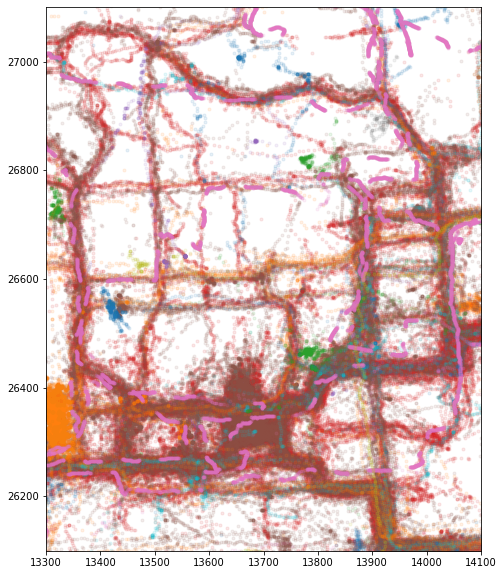

In [10]:
plt.figure(figsize=(18,10))
plt.xlim([13300, 14100])
plt.ylim([26100, 27100])
plt.gca().set_aspect('equal')
for person_id in big_dict:
    plt.scatter(big_dict[person_id]['x'], big_dict[person_id]['y'], alpha=0.1, marker='.')
plt.show()

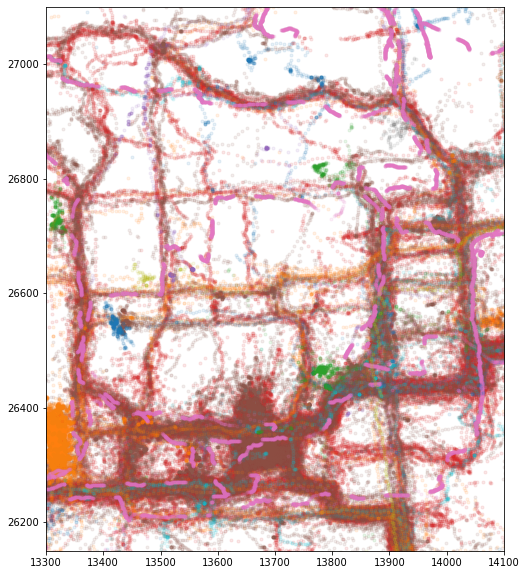

In [12]:
plt.figure(figsize=(18,10))
plt.xlim([13300, 14100])
plt.ylim([26150, 27100])
plt.gca().set_aspect('equal')
for person_id in big_dict:
    plt.scatter(big_dict[person_id]['x'], big_dict[person_id]['y'], alpha=0.1, marker='.')
plt.show()

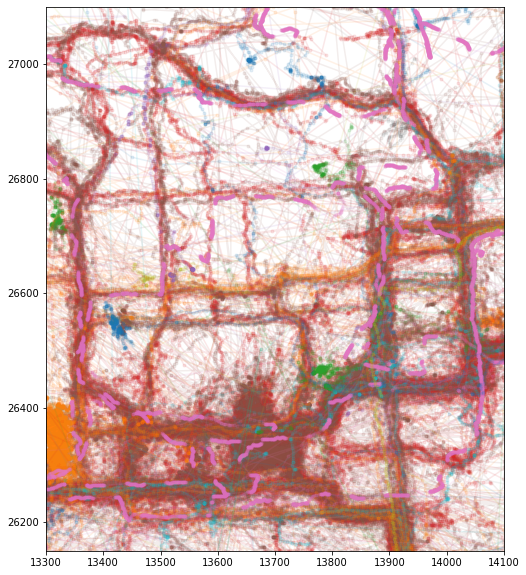

In [15]:
plt.figure(figsize=(18,10))
plt.xlim([13300, 14100])
plt.ylim([26150, 27100])
plt.gca().set_aspect('equal')
for person_id in big_dict:
    plt.plot(big_dict[person_id]['x'], big_dict[person_id]['y'], '.-', alpha=0.1)
plt.show()

In [3]:
# Get a subset of trajectories in this area.
smol_dict = {}

for person_id in big_dict:
    print("Looking at person {}.".format(person_id))
    
    smol_df = big_dict[person_id].loc[(big_dict[person_id]['x'] > 13300) &
                                      (big_dict[person_id]['x'] < 14100) &
                                      (big_dict[person_id]['y'] > 26150) &
                                      (big_dict[person_id]['y'] < 27100)]

    # We want at least 10 samples within this area to work with.
    # If the GPS values generally lay outside of this area, just ignore this person.
    if len(smol_df) <= 10:
        continue
    
    print("Wowzers! {} has {} points in this area!".format(person_id, len(smol_df)))
    
    # Finagle the time to remove all gaps in data collection again.
    smol_df = smol_df.sort_values("time")
    smol_df["time_diff"] = smol_df.diff()["time"]
    diff_cap = np.percentile(smol_df["time_diff"].iloc[1:], 99)
    smol_df["cap_diff"] = smol_df["time_diff"].clip(upper=diff_cap).fillna(0)
    smol_df["norm_time"] = smol_df["cap_diff"].cumsum()
    
    # Add the new dataframe to our smol_dict.
    smol_dict[person_id] = smol_df

Looking at person 135.
Looking at person 104.
Wowzers! 104 has 3059 points in this area!
Looking at person 103.
Looking at person 168.
Looking at person 157.
Looking at person 150.
Looking at person 159.
Looking at person 166.
Looking at person 161.
Looking at person 102.
Looking at person 105.
Wowzers! 105 has 52 points in this area!
Looking at person 133.
Wowzers! 133 has 563 points in this area!
Looking at person 134.
Looking at person 158.
Looking at person 167.
Wowzers! 167 has 1147 points in this area!
Looking at person 151.
Looking at person 169.
Looking at person 156.
Looking at person 024.
Wowzers! 024 has 314 points in this area!
Looking at person 023.
Looking at person 015.
Looking at person 012.
Looking at person 079.
Looking at person 046.
Looking at person 041.
Looking at person 048.
Looking at person 077.
Looking at person 083.
Wowzers! 083 has 422 points in this area!
Looking at person 084.
Looking at person 070.
Looking at person 013.
Looking at person 014.
Looking at 

In [4]:
len(smol_dict)

37

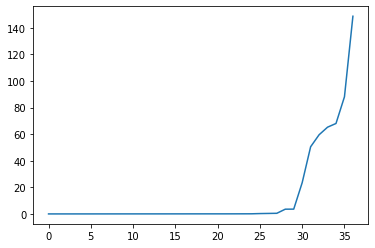

In [6]:
end_times = []
for person_id in smol_dict:
    end_times.append(smol_dict[person_id].iloc[-1]["norm_time"])
    
end_times.sort()
plt.figure()
plt.plot(end_times)
plt.show()

Mmm not entirely sure how this norm time has time across 140 days when norm time with big_dict was only up to 60. Suspicious.

In [8]:
for person_id in smol_dict:
    print(smol_dict[person_id].head())

        latitude   longitude          time  time_diff  cap_diff  norm_time  \
13713  39.988905  116.305305  39421.497234        NaN  0.000000   0.000000   
13714  39.988890  116.305308  39421.497245   0.000012  0.000012   0.000012   
13715  39.988797  116.305413  39421.497303   0.000058  0.000058   0.000069   
13716  39.988768  116.305378  39421.497361   0.000058  0.000058   0.000127   
13717  39.987917  116.305465  39421.500139   0.002778  0.002778   0.002905   

                x           y     norm_secs  
13713  13908.8439  26518.4439  18638.560039  
13714  13909.2213  26516.7789  18639.560042  
13715  13920.8763  26506.4226  18644.560035  
13716  13916.9913  26503.2813  18649.560038  
13717  13926.6150  26408.7426  18889.560040  
      latitude   longitude          time  time_diff  cap_diff  norm_time  \
592  39.988783  116.305383  39360.675590        NaN  0.000000   0.000000   
593  39.988633  116.306517  39360.675683   0.000093  0.000093   0.000093   
594  39.988400  116.306533 

In [9]:
print(end_times)

[0.00032407409889856353, 0.00045509264353313475, 0.0017361110949423164, 0.0029861111033824272, 0.004918981503578834, 0.005034722198615782, 0.013395833529575626, 0.014456018630880862, 0.017418981609807815, 0.021736111542850267, 0.023958912124944595, 0.0244155092004803, 0.02738425910501975, 0.02894004627116373, 0.03254629643925, 0.03601041658403131, 0.03615509293129433, 0.044710647774627466, 0.04756944473047042, 0.05130787470989162, 0.05190972225682344, 0.053113425898482086, 0.06027777802955825, 0.07662037153204437, 0.0899884261743864, 0.26059027776529586, 0.35979166900506243, 0.4644930553421622, 3.5570472061652367, 3.600375003185057, 23.481085879793618, 50.50240277823757, 59.51368611105547, 65.21919675915998, 68.0161240741373, 88.0547422454223, 148.6491874999977]


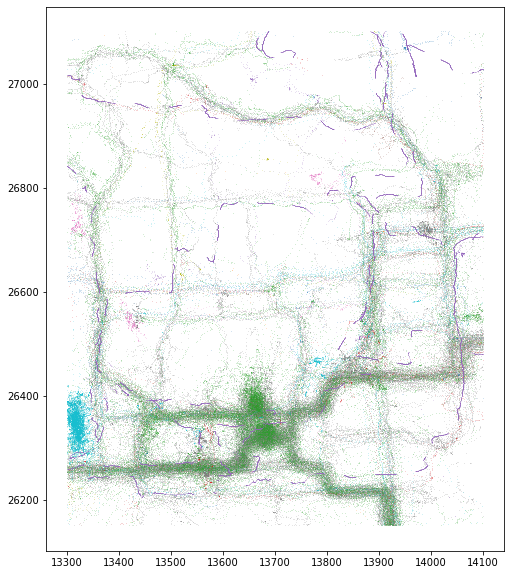

In [13]:
plt.figure(figsize=(18,10))
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)
plt.show()

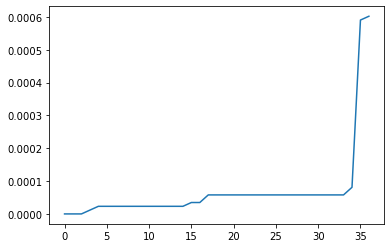

In [15]:
time_grain = []
for person_id in smol_dict:
    time_grain.append(smol_dict[person_id].mode()["cap_diff"][0])
time_grain.sort()

plt.figure()
plt.plot(time_grain)
plt.show()

In [16]:
time_grain

[0.0,
 0.0,
 0.0,
 1.157409860752523e-05,
 2.3148102627601475e-05,
 2.3148102627601475e-05,
 2.3148102627601475e-05,
 2.3148102627601475e-05,
 2.3148102627601475e-05,
 2.3148102627601475e-05,
 2.3148102627601475e-05,
 2.3148102627601475e-05,
 2.3148102627601475e-05,
 2.3148102627601475e-05,
 2.314819721505046e-05,
 3.4722201235126704e-05,
 3.4722201235126704e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 5.787039845017716e-05,
 8.101850107777864e-05,
 0.0005902777993469499,
 0.0006018518979544751]

In [24]:
for person_id in smol_dict:
    time_grain = smol_dict[person_id].mode()["cap_diff"][0]
    if time_grain < 1e-05 or time_grain > 6e-05:
        del smol_dict[person_id]

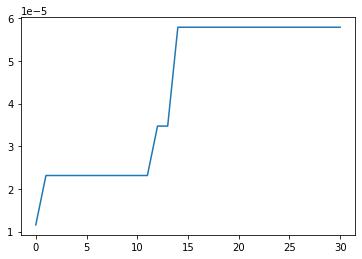

[1.157409860752523e-05, 2.3148102627601475e-05, 2.3148102627601475e-05, 2.3148102627601475e-05, 2.3148102627601475e-05, 2.3148102627601475e-05, 2.3148102627601475e-05, 2.3148102627601475e-05, 2.3148102627601475e-05, 2.3148102627601475e-05, 2.3148102627601475e-05, 2.314819721505046e-05, 3.4722201235126704e-05, 3.4722201235126704e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05, 5.787039845017716e-05]


In [25]:
time_grain = []
for person_id in smol_dict:
    time_grain.append(smol_dict[person_id].mode()["cap_diff"][0])
time_grain.sort()

plt.figure()
plt.plot(time_grain)
plt.show()

print(time_grain)

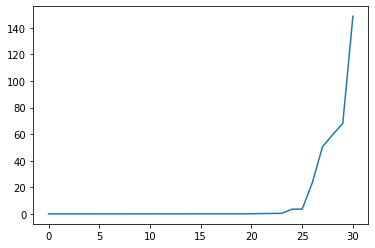

In [26]:
end_times = []
for person_id in smol_dict:
    end_times.append(smol_dict[person_id].iloc[-1]["norm_time"])
    
end_times.sort()
plt.figure()
plt.plot(end_times)
plt.show()

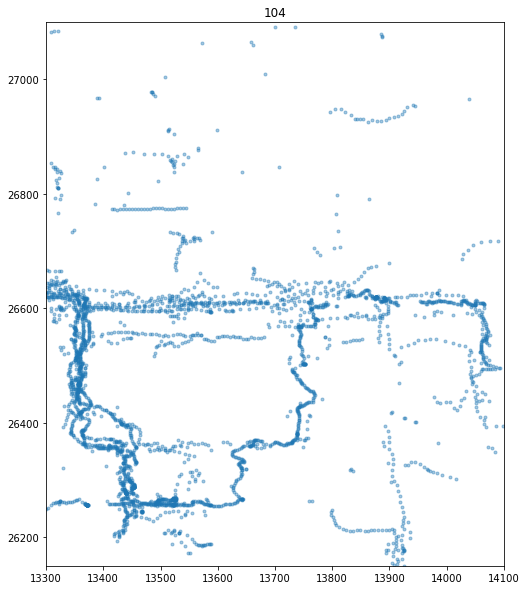

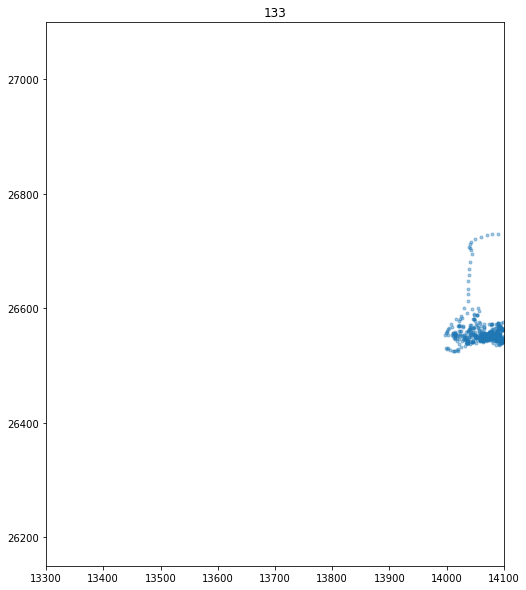

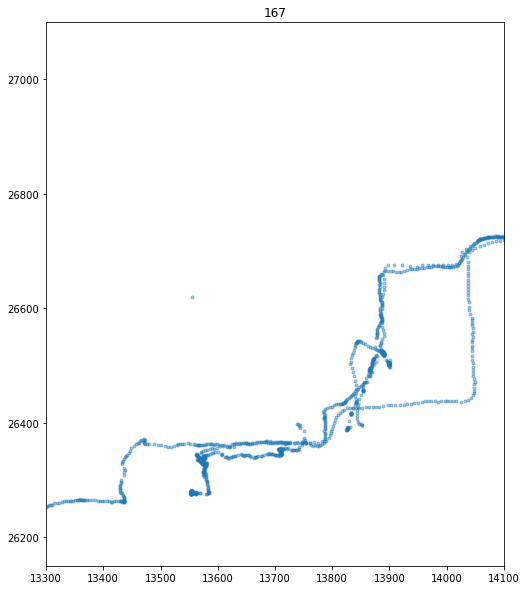

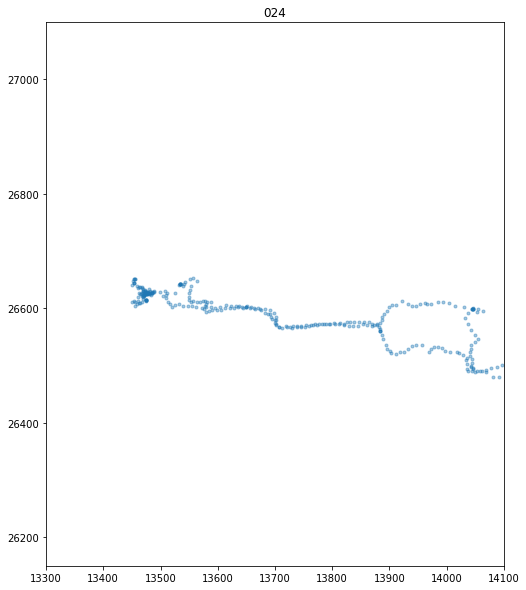

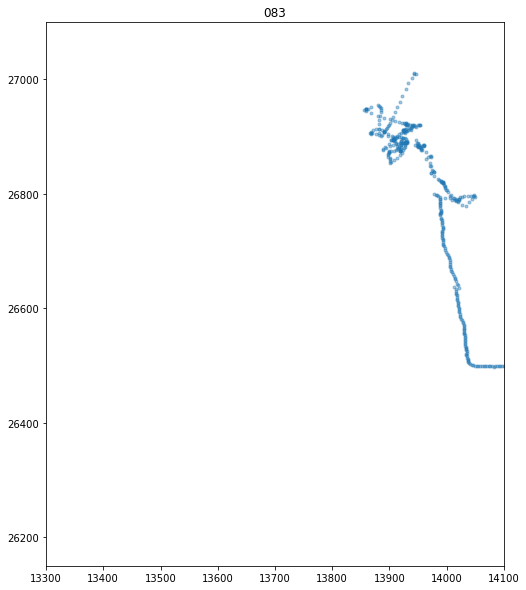

...

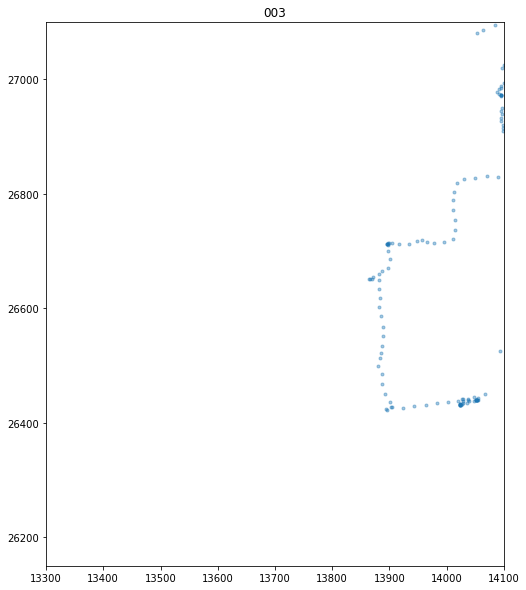

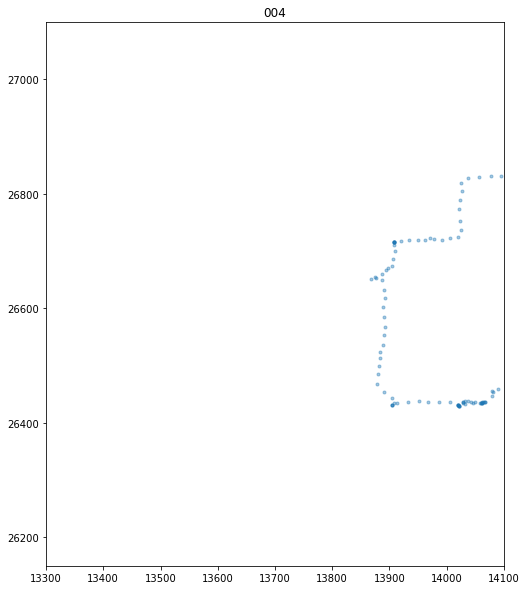

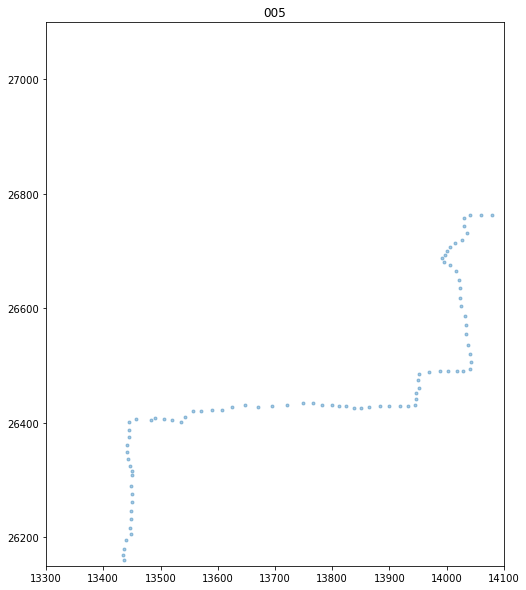

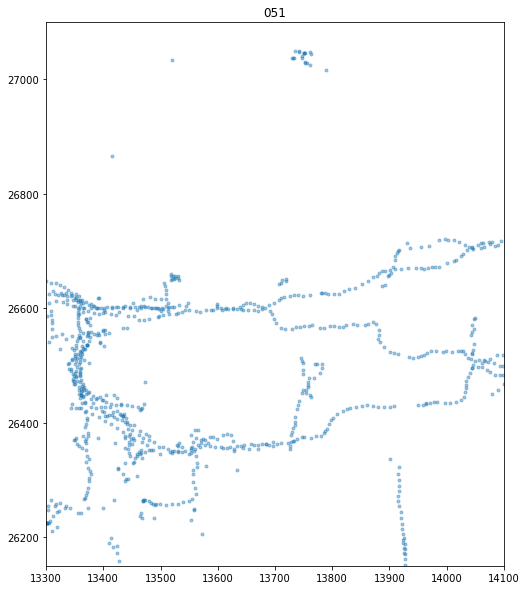

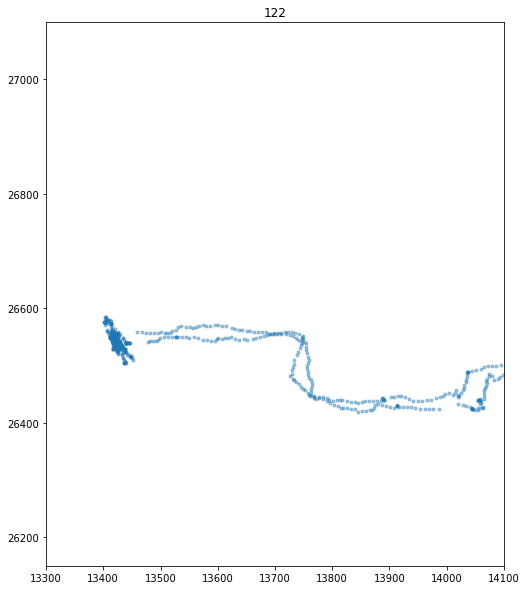

In [31]:
for person_id in smol_dict:
    plt.figure(figsize=(18,10))
    plt.title(person_id)
    plt.xlim([13300, 14100])
    plt.ylim([26150, 27100])
    plt.gca().set_aspect("equal")
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], '.', alpha=0.4)
    plt.show()

In [32]:
# make a backup just in case
import copy

smol_copy = copy.deepcopy(smol_dict)

In [ ]:
# time to go cherry-picking
del smol_dict['133']
del smol_dict['083']
del smol_dict['078']
del smol_dict['065']
del smol_dict['000']
del smol_dict['036']
del smol_dict['064']
del smol_dict['026']
del smol_dict['110']
del smol_dict['101']
del smol_dict['073']
del smol_dict['020']
del smol_dict['016']
del smol_dict['003']
del smol_dict['004']
del smol_dict['005']
del smol_dict['122']

In [35]:
len(smol_dict)

14

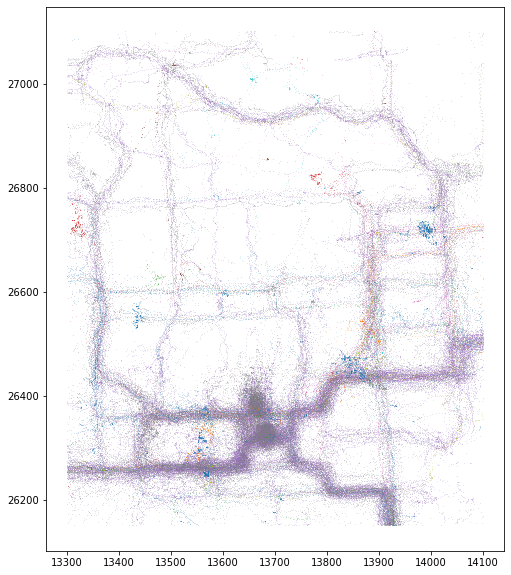

In [36]:
plt.figure(figsize=(18,10))
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)
plt.show()

In [37]:
smol_copy_2 = copy.deepcopy(smol_dict)

In [38]:
del smol_dict['025']
del smol_dict['062']

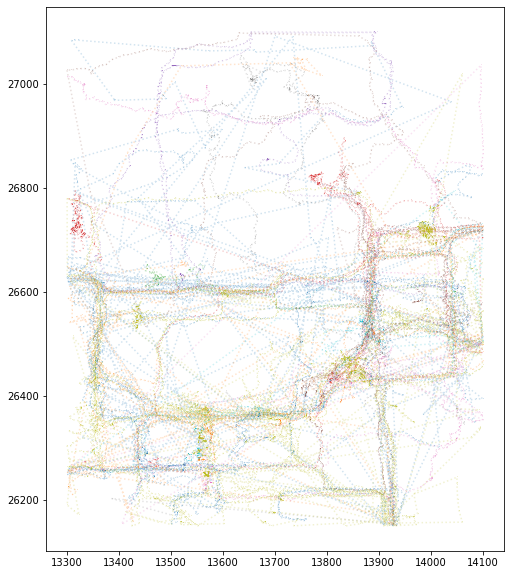

In [41]:
plt.figure(figsize=(18,10))
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',:', alpha=0.2)
plt.show()

Ok, that last delete might have been too much. 

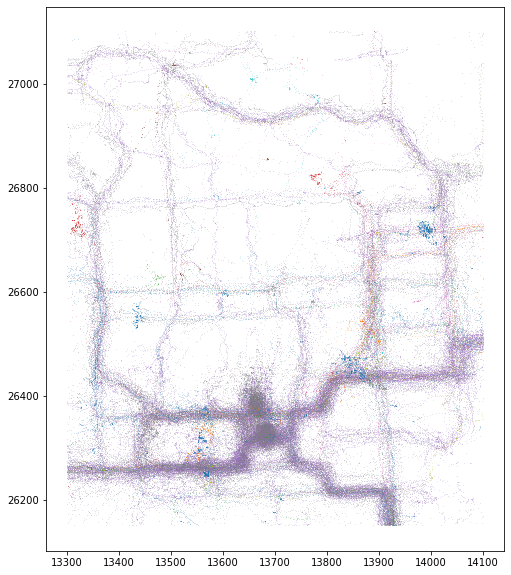

In [43]:
smol_dict = smol_copy_2
plt.figure(figsize=(18,10))
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)
plt.show()

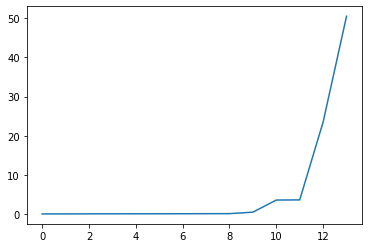

In [44]:
end_times = []
for person_id in smol_dict:
    end_times.append(smol_dict[person_id].iloc[-1]["norm_time"])
    
end_times.sort()
plt.figure()
plt.plot(end_times)
plt.show()

In [45]:
end_times

[0.017418981609807815,
 0.021736111542850267,
 0.03601041658403131,
 0.044710647774627466,
 0.04756944473047042,
 0.053113425898482086,
 0.06027777802955825,
 0.07662037153204437,
 0.0899884261743864,
 0.4644930553421622,
 3.5570472061652367,
 3.600375003185057,
 23.481085879793618,
 50.50240277823757]

In [46]:
for person_id in smol_dict:
    end_time = smol_dict[person_id].iloc[-1]["norm_time"]
    if end_time > 20:
        print("{} takes {} days.".format(person_id, end_time))

104 takes 23.481085879793618 days.
051 takes 50.50240277823757 days.


That is unexpected. Those two traces are not particularly thicc at all? Weird...

In [48]:
smol_dict['104'].head()

,latitude,longitude,time,time_diff,cap_diff,norm_time,x,y,norm_secs
13713,39.988905,116.305305,39421.497234,NaN,0.000000,0.000000,13908.8439,26518.4439,18638.560039
13714,39.988890,116.305308,39421.497245,0.000012,0.000012,0.000012,13909.2213,26516.7789,18639.560042
13715,39.988797,116.305413,39421.497303,0.000058,0.000058,0.000069,13920.8763,26506.4226,18644.560035
13716,39.988768,116.305378,39421.497361,0.000058,0.000058,0.000127,13916.9913,26503.2813,18649.560038
13717,39.987917,116.305465,39421.500139,0.002778,0.002778,0.002905,13926.6150,26408.7426,18889.560040


In [49]:
smol_dict['104'].tail()

,latitude,longitude,time,time_diff,cap_diff,norm_time,x,y,norm_secs
38355,39.989820,116.299910,39733.820509,0.000023,0.000023,23.480993,13309.9989,26620.0200,790887.200800
38356,39.989820,116.299892,39733.820532,0.000023,0.000023,23.481016,13307.9676,26620.0200,790889.200797
38357,39.989820,116.299872,39733.820556,0.000023,0.000023,23.481040,13305.7476,26620.0200,790891.200801
38358,39.989817,116.299852,39733.820579,0.000023,0.000023,23.481063,13303.5276,26619.6426,790893.200797
38359,39.989815,116.299832,39733.820602,0.000023,0.000023,23.481086,13301.3076,26619.4539,790895.200793


In [50]:
smol_dict['104']

,latitude,longitude,time,time_diff,cap_diff,norm_time,x,y,norm_secs
13713,39.988905,116.305305,39421.497234,NaN,0.000000,0.000000,13908.8439,26518.4439,18638.560039
13714,39.988890,116.305308,39421.497245,0.000012,0.000012,0.000012,13909.2213,26516.7789,18639.560042
13715,39.988797,116.305413,39421.497303,0.000058,0.000058,0.000069,13920.8763,26506.4226,18644.560035
13716,39.988768,116.305378,39421.497361,0.000058,0.000058,0.000127,13916.9913,26503.2813,18649.560038
13717,39.987917,116.305465,39421.500139,0.002778,0.002778,0.002905,13926.6150,26408.7426,18889.560040
...,...,...,...,...,...,...,...,...,...
38355,39.989820,116.299910,39733.820509,0.000023,0.000023,23.480993,13309.9989,26620.0200,790887.200800
38356,39.989820,116.299892,39733.820532,0.000023,0.000023,23.481016,13307.9676,26620.0200,790889.200797
38357,39.989820,116.299872,39733.820556,0.000023,0.000023,23.481040,13305.7476,26620.0200,790891.200801
38358,39.989817,116.299852,39733.820579,0.000023,0.000023,23.481063,13303.5276,26619.6426,790893.200797


In [51]:
smol_copy_3 = copy.deepcopy(smol_dict)

In [52]:
del smol_dict['104']
del smol_dict['051']

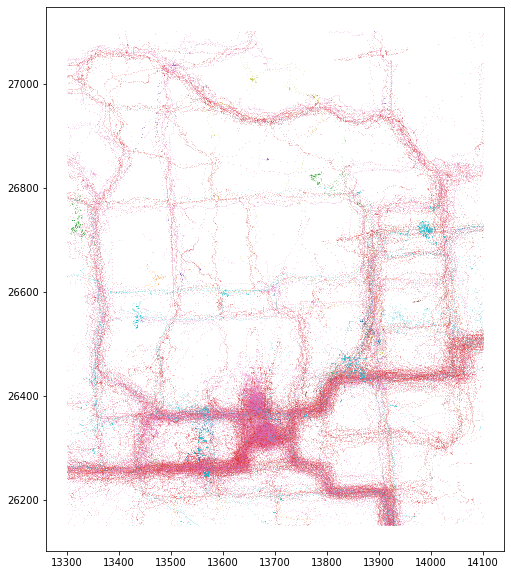

In [53]:
plt.figure(figsize=(18,10))
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)
plt.show()

In [54]:
len(smol_dict)

12

Ok, I think this is fine. It's only a couple days' worth of data and has only 12 people (mainly from two of these people though lmao). Now let's place some sensors!

In [55]:
ped_points = []
for person_id in smol_dict:
    ped_points += [[x, y] for x, y in zip(smol_dict[person_id]['x'], smol_dict[person_id]['y'])]
ped_points = np.array(ped_points)

In [56]:
np.random.shuffle(ped_points)

In [57]:
len(ped_points)

155750

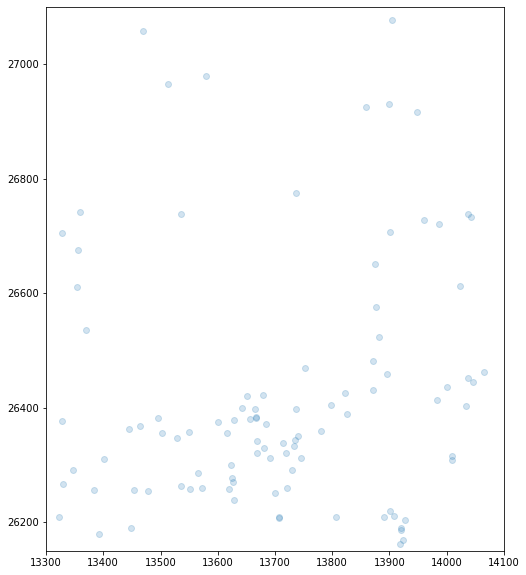

In [60]:
# print out a hundred random points
plt.figure(figsize=(18, 10))
plt.xlim([13300, 14100])
plt.ylim([26150, 27100])
plt.gca().set_aspect("equal")
plt.scatter(ped_points[:100, 0], ped_points[:100, 1], alpha=0.2)
plt.show()

In [59]:
for person_id in smol_dict:
    print("{} has {} points".format(person_id, len(smol_dict[person_id])))

167 has 1147 points
024 has 314 points
022 has 1670 points
025 has 87539 points
071 has 1125 points
085 has 2573 points
062 has 46981 points
038 has 1923 points
007 has 869 points
052 has 9620 points
126 has 857 points
011 has 1132 points


Right now, the sensor positions are kind of heavily distributed around the bottom of the area because that's where a lot of the traces run. There's nothing particularly wrong with that, but it's kinda lame ngl.

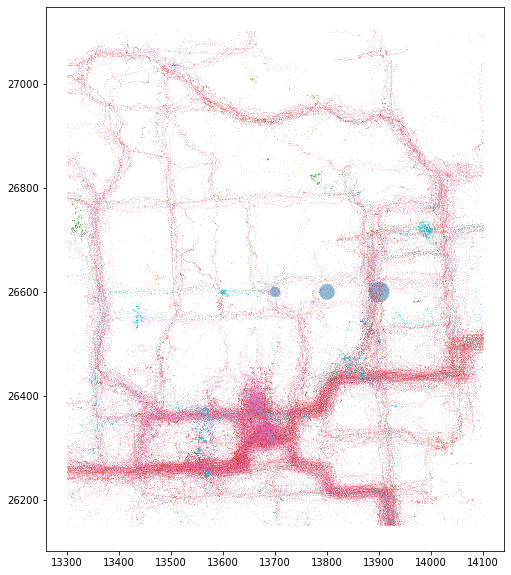

In [64]:
plt.figure(figsize=(18,10))
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)

circle1 = plt.Circle((13600, 26600), 5, alpha = 0.5)
circle2 = plt.Circle((13700, 26600), 10, alpha = 0.5)
circle3 = plt.Circle((13800, 26600), 15, alpha = 0.5)
circle4 = plt.Circle((13900, 26600), 20, alpha = 0.5)

fig = plt.gcf()
ax = fig.gca()

ax.add_patch(circle1)
ax.add_patch(circle2)
ax.add_patch(circle3)
ax.add_patch(circle4)

plt.show()

In [67]:
upper_points = []
lower_points = []
for person_id in smol_dict:
    for x, y in zip(smol_dict[person_id]['x'], smol_dict[person_id]['y']):
        if y > 26500:
            upper_points.append([x, y])
        else:
            lower_points.append([x, y])
upper_points = np.array(upper_points)
lower_points = np.array(lower_points)

In [69]:
np.random.shuffle(upper_points)
np.random.shuffle(lower_points)

[]

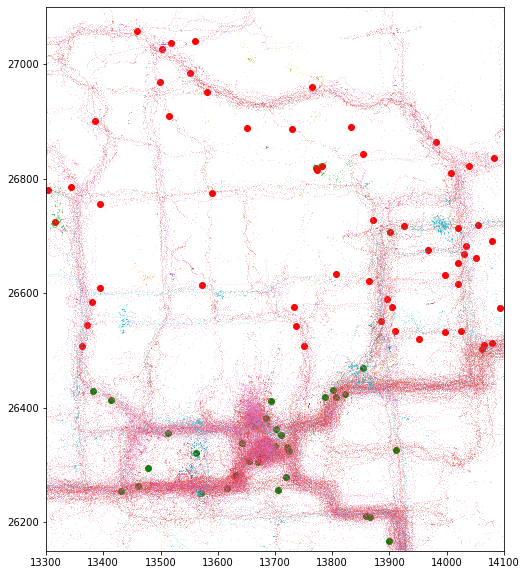

In [71]:
plt.figure(figsize=(18,10))
plt.xlim([13300, 14100])
plt.ylim([26150, 27100])
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)
plt.scatter(upper_points[:60, 0], upper_points[:60, 1], color='red')
plt.scatter(lower_points[:40, 0], lower_points[:40, 1], color='green')
plt.plot()


In [73]:
# I shuffle until it looks good lmao
np.random.shuffle(upper_points)
np.random.shuffle(lower_points)

[]

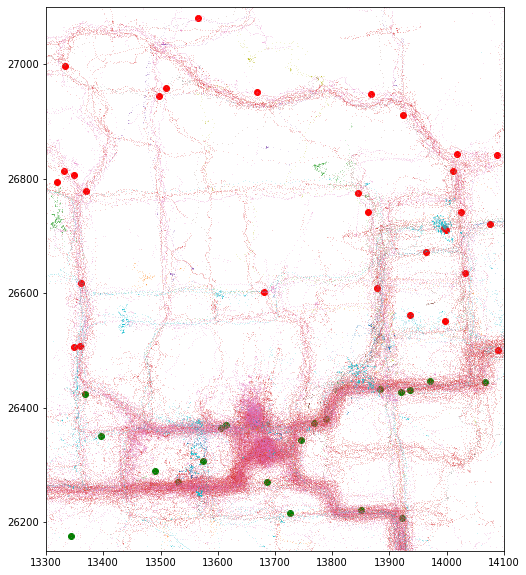

In [74]:
plt.figure(figsize=(18,10))
plt.xlim([13300, 14100])
plt.ylim([26150, 27100])
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)
plt.scatter(upper_points[:30, 0], upper_points[:30, 1], color='red')
plt.scatter(lower_points[:20, 0], lower_points[:20, 1], color='green')
plt.plot()


[]

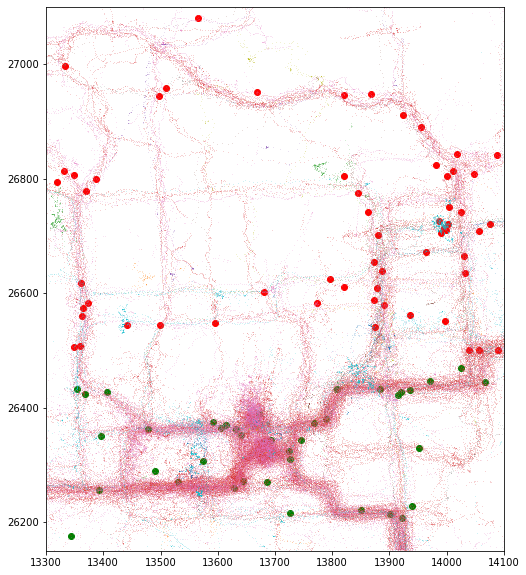

In [75]:
plt.figure(figsize=(18,10))
plt.xlim([13300, 14100])
plt.ylim([26150, 27100])
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)
plt.scatter(upper_points[:60, 0], upper_points[:60, 1], color='red')
plt.scatter(lower_points[:40, 0], lower_points[:40, 1], color='green')
plt.plot()


[]

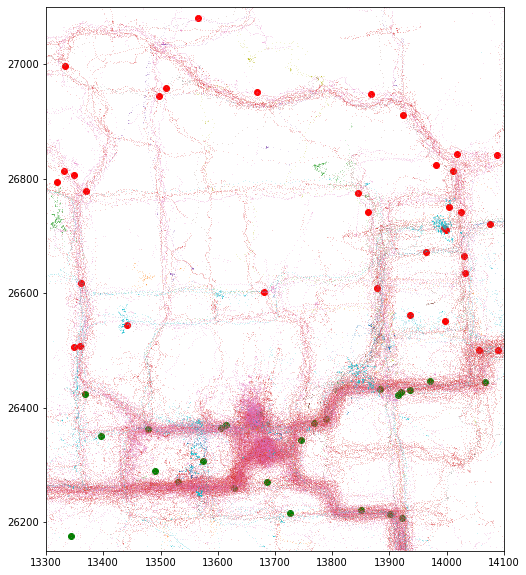

In [77]:
plt.figure(figsize=(18,10))
plt.xlim([13300, 14100])
plt.ylim([26150, 27100])
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)
plt.scatter(upper_points[:35, 0], upper_points[:35, 1], color='red')
plt.scatter(lower_points[:25, 0], lower_points[:25, 1], color='green')
plt.plot()


Ok, this one looks pretty good. I'll save it for now!

In [78]:
sensor_points = np.vstack([upper_points[:35], lower_points[:25]])

In [80]:
np.random.shuffle(sensor_points)

[]

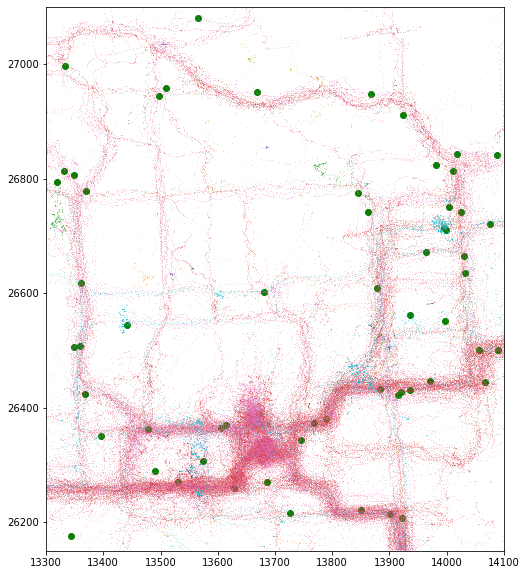

In [81]:
plt.figure(figsize=(18,10))
plt.xlim([13300, 14100])
plt.ylim([26150, 27100])
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)
plt.scatter(sensor_points[:, 0], sensor_points[:, 1], color='green')
plt.plot()

In [82]:
# Generate the range of these sensors to be between 10 and 20 meters
sensor_radii = np.random.uniform(low=10.0, high=20.0, size=60)

[]

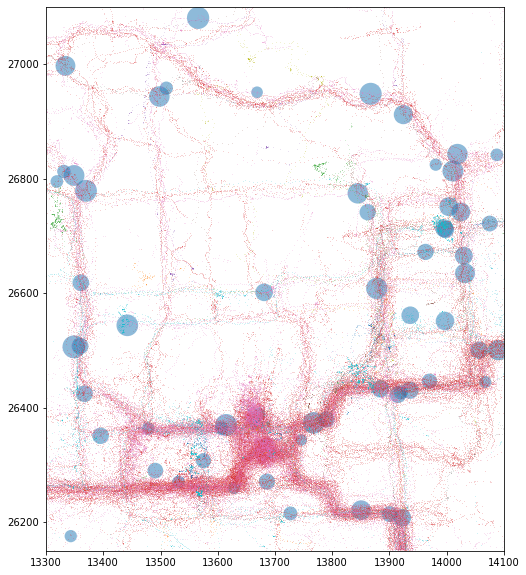

In [84]:
plt.figure(figsize=(18,10))
plt.xlim([13300, 14100])
plt.ylim([26150, 27100])
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)

fig = plt.gcf()
ax = fig.gca()
for i, pos in enumerate(sensor_points):
    ax.add_patch(plt.Circle(pos, sensor_radii[i], alpha = 0.5))

plt.plot()

In [85]:
# shift everything down to have the origin at the lower left
for person_id in smol_dict:
    smol_dict[person_id]['x'] = smol_dict[person_id]['x'] - 13300
    smol_dict[person_id]['y'] = smol_dict[person_id]['y'] - 26150

sensor_points = sensor_points - np.array([[13300, 26150]])

[]

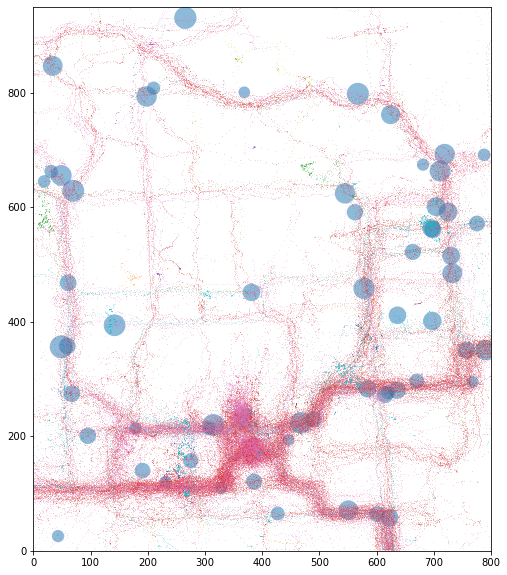

In [87]:
plt.figure(figsize=(18,10))
plt.xlim([0, 800])
plt.ylim([0, 950])
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)

fig = plt.gcf()
ax = fig.gca()
for i, pos in enumerate(sensor_points):
    ax.add_patch(plt.Circle(pos, sensor_radii[i], alpha = 0.5))

plt.plot()

In [92]:
# Ah, I forgot to adjust the norm_secs value.
secs_per_day = 86400

for person_id in smol_dict:
    smol_dict[person_id]['norm_secs'] = smol_dict[person_id]['norm_time'] * secs_per_day

## Ground Truth

Save our ground truth of sensor locations and radii, as well as gateway position and time.

In [88]:
# save sensor positions and radii
save_path = "smol_truth/sensors.csv"
with open(save_path, 'w') as save_file:
    save_file.write('sensor ID,x (m),y (m),radius (m)\n')
    for i, coords in enumerate(sensor_points):
        save_file.write('{},{},{},{}\n'.format(i, coords[0], coords[1], sensor_radii[i]))


In [93]:
# save mule positions and times
for person_id in smol_dict:
    save_path = "smol_truth/mules/{}.csv".format(person_id)
    with open(save_path, 'w') as save_file:
        save_file.write('x (m),y (m),norm_secs (secs),time (days)\n')
        for x, y, norm_secs, time in zip(smol_dict[person_id]['x'],
                                         smol_dict[person_id]['y'],
                                         smol_dict[person_id]['norm_secs'],
                                         smol_dict[person_id]['time']):
            save_file.write('{},{},{},{}\n'.format(x, y, norm_secs, time))


In [94]:
# also save our dictionary because that's useful.
save_path = "smol_truth/smol_dict.pkl"
with open(save_path, 'wb') as save_file:
    pickle.dump(smol_dict, save_file)

## Simulation Data

We construct simulation data again. This time, we use 3.3 second intervals because that's a cool number. The code below is taken from `fast_sim.py`.

In [107]:
# Import libraries.
import os 
import gc 
import glob 
import math 
import pickle 
import numpy as np 
import pandas as pd 
from scipy.interpolate import interp1d 


# Load sensor data from file.
sensor_path = "smol_truth/sensors.csv"
with open(sensor_path, 'r') as sensor_file:
    sensor_data = np.genfromtxt(sensor_file, delimiter=',', skip_header=1, usecols=(1,2,3))
num_sensors = sensor_data.shape[0]
sensor_points = sensor_data[:, :2].reshape((num_sensors, 1, 2))
#sensor_radii = sensor_data[:, 2].reshape((num_sensors, 1, 1))
sensor_radii = sensor_data[:, 2].reshape((num_sensors, 1))


# Generate simulated trace information for the attacks.
mules_dir = r"smol_truth/mules/*.csv"
for mule_path in glob.iglob(mules_dir):
    mule_name = mule_path.split('/')[-1]
    
    # Skip this person if there is already simulated data for them.
    save_path = "smol_sim/mules/{}".format(mule_name)
    if os.path.exists(save_path):
        print("Skipping {} because it has already been processed.".format(mule_name[:3]))
        continue 
    
    # Load mule data from file.
    mule_data = np.loadtxt(mule_path, delimiter=',', skiprows=1)
    s = mule_data[:,2]
    xyt = mule_data[:,[0,1,3]]
    f = interp1d(s, xyt, axis=0)
    
    # Send broadcasts every 3.3 seconds.
    num_samples = int(s[-1] / 3.3)
    s_int = np.linspace(s[0], s[-1], num=num_samples, endpoint=True)
    xyt_int = f(s_int)

    # Split the calculation into smaller chunks so calculation fits in memory.
    steps_per_split = 1000
    num_splits = math.ceil(num_samples / steps_per_split)

    # Print statement for a sanity check.
    print("Starting processing for {}, which has {} time steps.".format(mule_name[:3], num_samples))

    # Save our results to file.
    with open(save_path, 'w') as save_file:
        save_file.write('sensor ID,norm_secs (secs),time (days)\n')

        # Calculate the distance from each node at each time step.
        cur_steps = 0
        for i in range(num_splits): 
            #dist = np.linalg.norm(sensor_points - pos_int[i*steps_per_split:(i+1)*steps_per_split, :], axis=2)
            #sensor_ids = np.argwhere((dist < sensor_radii).T) # Time step, sensor ID.
            #seen_sensors = np.vstack([sensor_ids[:,1], s_int[sensor_ids[:, 0] + i*steps_per_split], t_int[sensor_ids[:, 0] + i*steps_per_split]]).T # Sensor ID, norm_secs, time.
            
            # Calculate interactions based on infinity norm instead of Euclidean norm to simplify calculations.
            #mask = (np.abs(sensor_points - xyt_int[cur_steps:cur_steps + steps_per_split, :1]) < sensor_radii).all(axis=2)
            #sensor_ids = np.argwhere(mask.T)
            #seen_sensors = np.vstack([sensor_ids[:, 1], s_int[sensor_ids[:, 0] + cur_steps], xyt_int[sensor_ids[:, 0] + cur_steps, 2]]).T # Sensor ID, norm_secs, time.
            
            # Try taking Euclidean distances since our sample size is smaller.
            dist = np.linalg.norm(sensor_points - xyt_int[cur_steps:cur_steps + steps_per_split, :1], axis=2)
            sensor_ids = np.argwhere((dist < sensor_radii).T)
            seen_sensors = np.vstack([sensor_ids[:, 1], s_int[sensor_ids[:, 0] + cur_steps], xyt_int[sensor_ids[:, 0] + cur_steps, 2]]).T # Sensor ID, norm_secs, time.
            np.savetxt(save_file, seen_sensors, delimiter=',')
            cur_steps += steps_per_split

            # Explicitly delete matrices and run the garbage collector to avoid running out of memory.
            #del mask, sensor_ids, seen_sensors 
            del dist, sensor_ids, seen_sensors 
            gc.collect()

    # Explicitly delete variables and run the garbage collector to avoid running out of memory.
    del mule_data, s, xyt, f, s_int, xyt_int
    gc.collect()

Starting processing for 022, which has 2356 time steps.
Starting processing for 024, which has 456 time steps.
Starting processing for 025, which has 93129 time steps.
Starting processing for 126, which has 942 time steps.
Starting processing for 085, which has 2006 time steps.
Starting processing for 052, which has 12161 time steps.
Starting processing for 062, which has 94264 time steps.
Starting processing for 071, which has 1578 time steps.
Starting processing for 167, which has 569 time steps.
Starting processing for 007, which has 1245 time steps.
Starting processing for 011, which has 1170 time steps.
Starting processing for 038, which has 1390 time steps.


[]

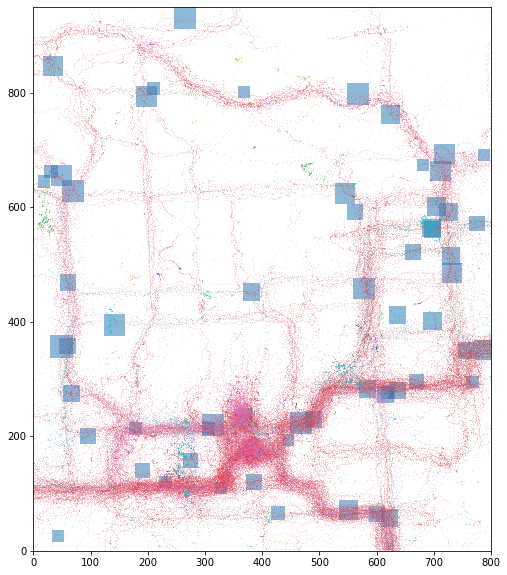

In [105]:
plt.figure(figsize=(18,10))
plt.xlim([0, 800])
plt.ylim([0, 950])
plt.gca().set_aspect("equal")
for person_id in smol_dict:
    plt.plot(smol_dict[person_id]['x'], smol_dict[person_id]['y'], ',', alpha=0.2)

fig = plt.gcf()
ax = fig.gca()
for i, pos in enumerate(sensor_points):
    ax.add_patch(plt.Rectangle(pos[0] - sensor_radii[i], 2*sensor_radii[i], 2*sensor_radii[i], alpha = 0.5))

plt.plot()

In [101]:
pos[0]

array([231.2663, 120.1813])

In [104]:
sensor_radii = sensor_radii.reshape((60))